# Lesson #1: Introduction to Keras and Tensorflow with Python



Keras is a deep learning API written in Python that can run on top of TensorFlow. It is quite popular among deep learning users because of its ease of use. TensorFlow is an end-to-end open-source deep learning framework developed and maintained by Google. Similar to Numpy, TensorFlow allows for mathematical computations and manipulation between numerical tensors, runs on CPUs, GPUs, and TPUs. Keras was incorporated in TensorFlow 2.0 (the recent version) as tf.keras (high-level API) and can run on the aforementioned hardwares. TensorFlow also allows for low-level operations with the TensorFlow Core API.&nbsp;

We will use the MNIST dataset to explain the concepts in the module. MNIST is a large database of handwritten digits commonly used in training and testing image processing systems. The image dimensions are 28x28 numpy arrays. Now let us import the images and prepare our dataset.

*P.S: it is advisable to use Google Colab to run all the code for the content and quiz in this module.*

In [ ]:
#!pip3 install Keras tensorflow

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.compat.v1 as tf
from tensorflow import keras

tf.disable_v2_behavior()

In [ ]:
mnist = keras.datasets.mnist
(train_imgs, train_lbls), (test_imgs, test_lbls) = mnist.load_data()

In [ ]:
print("Training data: {}, {}".format(train_imgs.shape, train_lbls.shape))
# prints Training data: (60000, 28, 28), (60000,)
print("Test data: {}, {}".format(test_imgs.shape, test_lbls.shape))
# prints Test data: (10000, 28, 28), (10000,)

Training data: (60000, 28, 28), (60000,)
Test data: (10000, 28, 28), (10000,)


In [ ]:
class_labels = np.unique(train_lbls)
print(
        "There are {} classes in the dataset. They are: {}".format(
        len(class_labels), 
        class_labels)
    )
# prints There are 10 classes in the dataset. They are: [0 1 2 3 4 5 6 7 8 9]

There are 10 classes in the dataset. They are: [0 1 2 3 4 5 6 7 8 9]


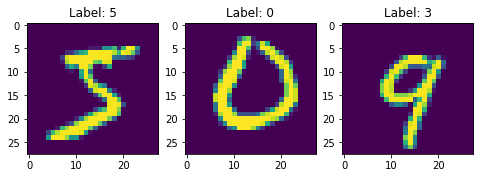

In [ ]:
plt.figure(figsize=(8, 5))

plt.subplot(1,3,1)
plt.imshow(train_imgs[0]) # To display 1st image on the list
plt.title("Label: {}".format(train_lbls[0]))

plt.subplot(1,3,2)
plt.imshow(train_imgs[2500]) # To display 2501th image on the list
plt.title("Label: {}".format(train_lbls[2500]))

plt.subplot(1,3,3)
plt.imshow(test_imgs[12]) # To display 15th image on the list
plt.title("Label: {}".format(train_lbls[12])) # Label should be 9.

plt.show()

In [ ]:
'''
As usual, we scale our dataset to range between 0 and 1. In this dataset, 
the pixel values range from 0 to 255.
Dividing the data by 255 scales to the required range
'''
before_scaling = train_imgs

train_imgs = train_imgs / 255.0
test_imgs = test_imgs / 255.0

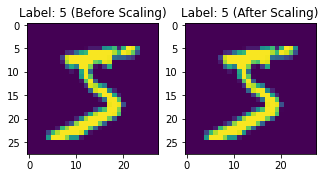

In [ ]:
plt.figure(figsize=(8, 5))

plt.subplot(1,3,1)
plt.imshow(before_scaling[0]) # To display 1st image on the list
plt.title("Label: {} (Before Scaling)".format(train_lbls[0]))

plt.subplot(1,3,2)
plt.imshow(train_imgs[0]) # To display 2501th image on the list
plt.title("Label: {} (After Scaling)".format(train_lbls[0]))

plt.show()

Text(0.5, 1.0, 'After Scaling')

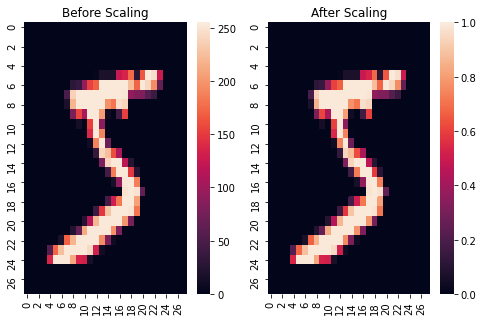

In [ ]:
import seaborn as sns

plt.figure(figsize=(8, 5))

sns.heatmap(before_scaling[0],
            ax = plt.subplot(1,2,1)
            ).set_title('Before Scaling')

sns.heatmap(train_imgs[0],
            ax = plt.subplot(1,2,2)
            ).set_title('After Scaling')

In [ ]:
x_train = train_imgs[0:50000]
x_val = train_imgs[50000:]
y_train = train_lbls[0:50000]
y_val = train_lbls[50000:]

print("x_train: {}".format(x_train.shape)) # prints x_train: (50000, 28, 28)
print("x_val: {}".format(x_val.shape)) # prints x_val: (10000, 28, 28)
print("y_train: {}".format(y_train.shape)) #prints y_train: (50000,)
print("y_val: {}".format(y_val.shape)) #prints y_val: (10000,)

x_train: (50000, 28, 28)
x_val: (10000, 28, 28)
y_train: (50000,)
y_val: (10000,)


In [ ]:
new_dimension = np.prod(train_imgs.shape[1:])
x_train = x_train.reshape(x_train.shape[0], new_dimension)
x_val = x_val.reshape(x_val.shape[0], new_dimension)
test_imgs = test_imgs.reshape(test_imgs.shape[0], new_dimension)

print("x_train: {}".format(x_train.shape)) #prints  x_train: (50000, 784)
print("x_val: {}".format(x_val.shape)) #prints x_val: (10000, 784)
print("test_images: {}".format(test_imgs.shape)) 
#prints test_images: (10000, 784)

x_train: (50000, 784)
x_val: (10000, 784)
test_images: (10000, 784)


In [ ]:
from tensorflow.keras.utils import to_categorical
no_labels = len(class_labels) #10
y_train = to_categorical(y_train, no_labels)
y_val = to_categorical(y_val, no_labels)
test_lbls = to_categorical(test_lbls, no_labels)

### Multilayer perceptron

A perceptron is a supervised learning algorithm for binary classifiers that separates an input into two classes by learning linearly separable patterns. It is a single layer neural network that multiplies input feature vectors by their weights, creates a weighted sum by summing these products, then adds a bias and applies an activation function to give the final output. Perceptrons are unable to solve complex problems that are not linearly separable.

## $$y = \phi\left( {\sum_{i=1}^nw_ix_i}+b\right) $$
### $$\phi = activation \hspace{1mm} function; w = weight \hspace{1mm} vector, i=input \hspace{1mm} vector, b = bias $$


In [ ]:
from IPython.display import Image
from IPython.core.display import HTML 
Image(url= "https://hamoyeusercontent-prod.s3.amazonaws.com/3cc91206f5885081f000")

The MultiLayer Perceptron (MLP) is a network of connected perceptrons stacked in layers with several hidden layers in between the input and output layers. When there’s a single hidden layer, MLPs are referred to as vanilla neural networks. MLPs are feedforward neural networks where information is transferred in the forward direction from the input layer to the output layer. The input data to the network is fed to the input layer, computations are performed on the data in the hidden layers, and meaningful results returned in the output layer. The importance of the connections between layers is specified by the weights assigned.

In [ ]:
Image(url= "https://hamoyeusercontent-prod.s3.amazonaws.com/aa1d1206f5c66241f000")

#### Backpropagation and its Derivative

Backpropagation is the method of traversing the neural network in reverse (right to left) in order to obtain the gradient of neural network parameters with respect to a loss function. It is an iterative way of updating the weights in the network to get better predictions using a form of gradient descent until the minimum of the loss function is obtained. Different loss functions can be selected for various tasks. The loss is reduced in a controlled manner by taking small steps from the starting point to the final point which is the lowest possible point. The derivative of the loss function provides information on which direction to take when traversing. The weight can be updated using gradient descent which we will discuss later.&nbsp;

Simply put, backpropagation involves calculating the sum of errors in the network to obtain the loss function, and the partial derivative of the loss function with respect to individual weights. It also uses gradient descent to update the weights.

#### Activation functions and Neural Networks Hyperparameters

Activation functions introduce nonlinearity into the output of a neuron in a network to determine the output. This nonlinearity allows for the network to learn complex relationships between the input and response variables. Without activation functions in an artificial neural network, there will only be linear transformations on the input. The non-linear functions also allow for backpropagation because the gradients are obtained by derivatives of the functions and are used in updating weights. Some activation functions commonly used include sigmoid, tanh, relu, softmax, leaky relu and many others. When training the neural network, it is important to select the appropriate hyperparameters to improve the performance of the model. These are some of the hyperparameters:

1. **Hidden layers:** this is a measure of the learning capacity of the model. The more hidden layers of neurons present in the network, the better the learning capacity of the model. When too many layers than necessary are provided in a model, there is a tendency for overfitting to occur.
2. **Learning rate:** this controls how fast the model weights are updated before reaching optimal values. It will take the model a long time to reach the desired weights with a very small learning rate. In contrast, if the learning rate is much higher, the model might overshoot,pass the optimal point, and prevent convergence of the algorithm. This rate is how fast gradient descent is performed for backpropagation.
3. **Dropout:** this is used to shut a percentage of the neurons in the network to prevent overfitting.
4. **Batch size:** the number of data samples that can be propagated through the network before weights are updated. This is important in breaking up huge datasets into sizable batches to manage resources. This means that there are 10 batches for a dataset with 1000 samples and a batch size of 100.&nbsp;
5. **Epoch:** it is the number of cycles that the learning algorithm goes through the entire dataset. When all batches are fed once, an epoch is completed.





In [ ]:
# inputs
#placeholders are not enabled in tf 2
# placeholders are created for tensors so that it's able to feed value.
X = tf.placeholder(tf.float32, [None, new_dimension])
Y = tf.placeholder(tf.float32, [None, no_labels])

# create model architecture
def multilayer_perceptron(x, output_classes, first_layer_neurons=256, 
                          second_layer_neurons=128):

  '''
    tf.Variable is used to creating weight neurons and bias nuerons.
    tf.add is addition
    tf.matmul is multiplication
  '''  
  input_neurons = new_dimension
  # first layer
  weight1 = tf.Variable(tf.random_uniform([input_neurons, 
                                           first_layer_neurons]))
  bias1 = tf.Variable(tf.zeros([first_layer_neurons]))
  first_layer_output = tf.nn.relu(tf.add(tf.matmul(x, weight1), 
                                         bias1))
  
  # second layer
  weight2 = tf.Variable(tf.random_uniform([first_layer_neurons,
                                           second_layer_neurons]))
  bias2 = tf.Variable(tf.zeros([second_layer_neurons]))
  second_layer_output = tf.nn.relu(tf.add(tf.matmul(first_layer_output, 
                                                    weight2), 
                                          bias2))

  # output layer
  final_weight = tf.Variable(tf.random_uniform([second_layer_neurons, 
                                                output_classes]))
  final_bias = tf.Variable(tf.zeros([output_classes]))
  logits = tf.add(tf.matmul(second_layer_output, final_weight), 
                  final_bias)

  return logits


logits = multilayer_perceptron(X, no_labels)

learning_rate = 0.01
#we define the loss and optimiser for the network
loss_op = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits_v2(
                          logits=logits, 
                          labels=Y)
                        )
optimiser = tf.train.AdamOptimizer(learning_rate=learning_rate) #Adam algorithm
train_op = optimiser.minimize(loss_op)  #minimize the loss by updating var_list

#initialise the variables
init = tf.global_variables_initializer()

epochs = 30
batch_size = 10000
iteration = len(x_train) / batch_size


#train model
with tf.Session() as session:
  session.run(init)
  for epoch in range(epochs):
    average_cost = 0
    start, end = 0, batch_size

    for i in range(int(iteration)):
      batch_x, batch_y = x_train[start: end], y_train[start: end]
      _, loss = session.run([train_op, loss_op], 
                            feed_dict={X: batch_x, Y: batch_y})
      start += batch_size
      end += batch_size 
      #average loss
      average_cost += loss/iteration
    print("Epoch========{}".format(epoch))
    
  #evaluate model
  '''
    tf.argmax or tf.math.argmax return the element with maximum value.
    tf.reduce_mean return the mean computation.
    tf.equal compare 2 values
  '''
  prediction = tf.nn.softmax(logits)
  ground_truth = tf.equal(tf.argmax(prediction, 1), tf.argmax(Y, 1))
  accuracy = tf.reduce_mean(tf.cast(ground_truth, "float")) # convert to float
  print("Accuracy: {}".format(accuracy.eval({X: test_imgs, Y: test_lbls})))

Epoch========0
Epoch========1
Epoch========2
Epoch========3
Epoch========4
Epoch========5
Epoch========6
Epoch========7
Epoch========8
Epoch========9
Epoch========10
Epoch========11
Epoch========12
Epoch========13
Epoch========14
Epoch========15
Epoch========16
Epoch========17
Epoch========18
Epoch========19
Epoch========20
Epoch========21
Epoch========22
Epoch========23
Epoch========24
Epoch========25
Epoch========26
Epoch========27
Epoch========28
Epoch========29
Accuracy: 0.869700014591217


# Lesson #2: Common Regularization for Deep Learning

In previous modules, we have discussed regularisation and how it prevents overfitting in models. In deep learning, models are also susceptible to overfitting. As a result, different techniques have been developed to prevent overfitting. L1 &amp; L2 regularization, dropout, data augmentation, and early stopping are some regularization methods.

- **Dropout:** this is a frequently used technique in deep learning where units are ignored or dropped out in a neural network. A percentage of the neurons on each layer in the network are randomly selected and ignored, such that they do not make any contribution in the forward and backward pass. This automatically results in a much smaller network, where the neurons left are required to handle the representations that would have been used for predictions by the missing neurons, through the&nbsp; learning of more robust features. This process improves the generalization capabilities of the network, and reduces overfitting on the training data.

- **Data augmentation:** training the model on a larger dataset is another way to prevent overfitting. Data augmentation involves increasing the size of the training set by introducing minor changes like rotating, cropping, flipping, translating, and blurring to generate synthetic data from the dataset.&nbsp;

- **Early stopping:** when a model is trained for a longer period such that the validation error starts to increase, overfitting is said to occur. In early stopping, while fitting the model on the training data and evaluating on the validation set, when the validation error stops reducing or gets worse, the training process is terminated before the lowest training error is obtained, to prevent overfitting.

- **Data augmentation:** training the model on a larger dataset is another way to prevent overfitting. Data augmentation involves increasing the size of the training set by introducing minor changes like rotating, cropping, flipping, translating, and blurring to generate synthetic data from the dataset.&nbsp;

- **Early stopping:** when a model is trained for a longer period such that the validation error starts to increase, overfitting is said to occur. In early stopping, while fitting the model on the training data and evaluating on the validation set, when the validation error stops reducing or gets worse, the training process is terminated before the lowest training error is obtained, to prevent overfitting.




In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/47721206fe11a401f000')

**Optimisation for Training Deep Neural Networks**

When solving deep learning problems, a loss function is defined to minimize loss using an optimization algorithm like gradient descent, gradient descent with momentum, Adagrad, RMSProp, Adam, and others. While there are several optimisation algorithms, there are also some challenges such as local minima, saddle points, vanishing gradients, etc, faced in deep learning optimisation.&nbsp;

Local Minima: neural networks aim to continue updating weights until the global minimum (the lowest point of the entire network) is attained. Local minima refers to the lowest points of localised portions of a graph. The value of a loss function is minimal at a point in the local region. It is possible for the function to be stuck at a local minimum because it is the best point in that locality, which makes it difficult to reach the global minimum where the lowest loss can be achieved.&nbsp;

Vanishing Gradients: this is a problem that occurs when training a network using gradient descent methods. Vanishing gradients make it difficult to update the weights in the earlier layers of the network, and worsens as the number of layers increases. As we know, with gradient descent, the gradient controls how much learning happens in the network during training. While backpropagating in deep neural networks, the gradients tend to get smaller, and with small gradients little or no learning is done, hence, resulting in poor performance of models.

Although we have only discussed some of the challenges in deep learning optimisation at a high level, we will now discuss some optimisation algorithms.

Gradient Descent: this is a common and established optimisation algorithm used to obtain the minimum of an objective function J using the negative of the gradient to continuously move towards the steepest point. It can be likened to finding the lowest point of a mountain. Gradient descent can be summed up in the equation below:

## $$ w = w - \alpha\frac{\delta J}{\delta w} $$
### $$ \alpha = learning \hspace{2mm} rate; J = loss \hspace{2mm} function $$

Batch gradient descent, stochastic gradient descent, and mini-batch gradient descent are the three variants of gradient descent. Which variant would be used is determined by the size of data available.&nbsp;




In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/e4f51206ff07e3c1f000')

$Batch$ $gradient$ $descent$ computes the gradient of the cost function with the entire training set. Stochastic gradient descent (SDG) uses each sample in the training set to perform updates at a time. It is faster than batch gradient descent. Mini-batch gradient descent combines the logic of other variants by using only mini-batches of training examples to update weights. It allows for a stable convergence, because the variance of the parameter updates are also reduced.

**Gradient Descent with Momentum:** similar to gradient descent, the addition of momentum to the algorithm helps speed up convergence, by accelerating the gradient vectors in the right direction. With gradient descent, movement is not always in the optimal direction. However, gradient descent with momentum oscillates in the right direction, by considering past gradients, and computing exponentially weighted averages of the gradients which are used to update the weights.

**Adagrad - Adaptive Gradients:** adagrad changes the learning rate for every update by tracking the sum of gradient squared, and uses it to adjust the gradients in the right direction. Larger updates are performed for infrequent parameters with high learning rates, while smaller updates are performed for frequent parameters with low learning rates. This can be interpreted thus; “the more a parameter is updated, the less updates are required for the parameter in future updates, to allow for the updates of other parameters”. This makes it a suitable choice for sparse data.

**RMSProp - Root Mean Square Propagation:** though similar to Adagrad, RMSProp provides an exponentially decaying average as opposed to the sum of the gradients by Adagrad. It changes the learning rate slower and converges faster than Adagrad, by using a decay rate to consider the gradients of recent time steps.

**Adam - Adaptive Moment Estimation:** this algorithm uses the first and second moments of gradients while adapting the learning rate for each weight of the neural network. It can be likened to RMSProp with momentum such that exponential moving averages of gradients are calculated then squared. It also benefits from the advantages of Adagrad in that it works well with sparse gradients.

In [ ]:
from tensorflow.keras.layers import Dense
from tensorflow.keras.models import Sequential

In [ ]:
#Building a Sequential Feed Forward Network in Keras

model = Sequential()
model.add(Dense(256, activation='relu', input_shape=(new_dimension,)))
model.add(Dense(128, activation='relu'))
model.add(Dense(no_labels, activation='softmax'))
model.compile(optimizer='adam', loss=tf.keras.losses.categorical_crossentropy, 
              metrics=['accuracy'])

In [ ]:
history = model.fit(x_train, y_train, validation_data=(x_val, y_val), 
                    epochs=20, batch_size=1000)

test_loss, test_accuracy = model.evaluate(test_imgs, test_lbls)
print('Test loss: {}'.format(test_loss))
print('Test accuracy: {}'.format(test_accuracy))

Train on 50000 samples, validate on 10000 samples
Epoch 1/20
49000/50000 [============================>.] - ETA: 0s - loss: 0.6906 - acc: 0.8137WARNING:tensorflow:From /usr/local/lib/python3.6/dist-packages/tensorflow/python/keras/engine/training_v1.py:2048: Model.state_updates (from tensorflow.python.keras.engine.training) is deprecated and will be removed in a future version.
Instructions for updating:
This property should not be used in TensorFlow 2.0, as updates are applied automatically.
50000/50000 [==============================] - 1s 30us/sample - loss: 0.6828 - acc: 0.8156 - val_loss: 0.2626 - val_acc: 0.9254
Epoch 2/20
50000/50000 [==============================] - 1s 30us/sample - loss: 0.2370 - acc: 0.9318 - val_loss: 0.1866 - val_acc: 0.9501
Epoch 3/20
50000/50000 [==============================] - 1s 30us/sample - loss: 0.1757 - acc: 0.9488 - val_loss: 0.1501 - val_acc: 0.9589
Epoch 4/20
50000/50000 [==============================] - 1s 29us/sample - loss: 0.1373 - acc: 0

Text(0.5, 1.0, 'Loss Curves - before regularisation')

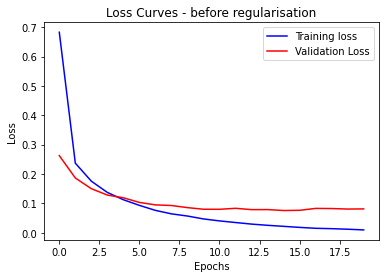

In [ ]:
#Check for Overfitting

plt.figure()
plt.plot(history.history['loss'], 'blue')
plt.plot(history.history['val_loss'], 'red')
plt.legend(['Training loss', 'Validation Loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curves - before regularisation')

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/21c61206ffd0ad01f000')

In [ ]:
#Although the validation and training loss seem great, we can see that the validation #loss increases. This identifies overfitting in our network. How do we proceed? #Introduce regularisation to the model.

from tensorflow.keras.layers import Dropout
reg_model = Sequential()
reg_model.add(Dense(256, activation='relu', input_shape=(new_dimension,)))
reg_model.add(Dropout(0.4))
reg_model.add(Dense(128, activation='relu'))
reg_model.add(Dropout(0.4))
reg_model.add(Dense(no_labels, activation='softmax'))

reg_model.compile(optimizer='adam', 
                  loss=tf.keras.losses.categorical_crossentropy, 
                  metrics=['accuracy'])

In [ ]:
reg_history = reg_model.fit(x_train, y_train, validation_data=(x_val, y_val), 
                            epochs=20, batch_size=1000)
test_loss, test_accuracy = reg_model.evaluate(test_imgs, test_lbls)
print('Test loss: {}'.format(test_loss))
print('Test accuracy: {}'.format(test_accuracy))

Train on 50000 samples, validate on 10000 samples
Epoch 1/20
50000/50000 [==============================] - 2s 37us/sample - loss: 0.9692 - acc: 0.6926 - val_loss: 0.2957 - val_acc: 0.9177
Epoch 2/20
50000/50000 [==============================] - 2s 36us/sample - loss: 0.3718 - acc: 0.8916 - val_loss: 0.2002 - val_acc: 0.9424
Epoch 3/20
50000/50000 [==============================] - 2s 36us/sample - loss: 0.2735 - acc: 0.9191 - val_loss: 0.1576 - val_acc: 0.9543
Epoch 4/20
50000/50000 [==============================] - 2s 36us/sample - loss: 0.2287 - acc: 0.9335 - val_loss: 0.1344 - val_acc: 0.9614
Epoch 5/20
50000/50000 [==============================] - 2s 35us/sample - loss: 0.1961 - acc: 0.9429 - val_loss: 0.1191 - val_acc: 0.9664
Epoch 6/20
50000/50000 [==============================] - 2s 35us/sample - loss: 0.1747 - acc: 0.9483 - val_loss: 0.1088 - val_acc: 0.9689
Epoch 7/20
50000/50000 [==============================] - 2s 35us/sample - loss: 0.1568 - acc: 0.9542 - val_loss: 0.

Text(0.5, 1.0, 'Loss Curves - after regularisation')

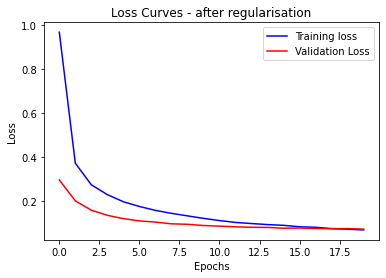

In [ ]:
plt.figure()
plt.plot(reg_history.history['loss'], 'blue')
plt.plot(reg_history.history['val_loss'], 'red')
plt.legend(['Training loss', 'Validation Loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curves - after regularisation')

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/764e1206ffdbe501f000')

# Lesson #3: Convolutional Neural Networks

##**Motivations**

Convolutional neural network also known as ConvNets or CNN is a class of deep, feed-forward, artificial neural networks specifically designed for image input. As a result of their performance in contrast to the traditional, fully-connected neural networks, CNNs have been widely applied in computer vision tasks such as image recognition, image classification, object detection, etc. More recently, they are being explored in the natural language processing domain by researchers. In a nutshell, we can teach computers to “see” using CNNs.

An image is a grid of numbers that represent pixel values, which are interpreted as a matrix of values by a computer. The convolution operation that occurs in a CNN network allows for sparse representation of inputs, by concentrating only on the relevant features. This is different from using a regular neural network which will increase the number of computations, by performing matrix multiplications. Additionally, parameter sharing in CNNs saves memory by using the same weight parameters for all neurons in the same feature map.&nbsp;&nbsp;

- Convolution operator.

- Layers, filters, pooling and feature maps

Convolutional layer, pooling layer, and fully-connected layer are the three main types of layers used to build the CNN architecture.

**Convolutional layer:** This is the building block of CNNs. In mathematics, convolution refers to a mathematical operation on two functions to create a third function. Unsurprisingly, as the name implies, a convolution operator is used to extract features such as colour, edges orientation, etc from input images in CNNs. It learns the image features using small squares of the input data to preserve the relationships between pixels.&nbsp; A convolution is performed on the input data using a filter or kernel to produce a feature map. By including more layers, the network is able to learn more high-level features, and have a better understanding of the images, and better identify unseen images. Considering a 5x5 image matrix with pixel values 0 and 1; and a 3x3 filter matrix, the convolution of both matrices results in a feature map as shown below

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/7f07120703b1e741f000')

We slide the filter matrix over the feature matrix by a set number of pixels, and perform an element-wise multiplication for each position. It is important to note that different filters perform different operations, by acting as feature detectors from the original images. The number of pixels or size of step the filter moves over is known as stride. To introduce non-linearity, a relu activation is applied after every convolution operation in the convolutional layer.

Pooling layer: this is the layer periodically inserted between successive convolution layers, where dimensionality reduction is performed by pooling. Pooling (also called downsampling) helps control overfitting, trains faster, and reduces the number of parameters and computations in the network. Although this reduces dimensionality, the important information is still retained. Maximum, average, and sum pooling are different types of pooling commonly used with max. Max pooling takes the maximum element from the feature map.

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/5dcd120703c000c1f000')

Fully connected layer: the features extracted from the convolution and pooling layers are fed into the fully connected layer, to use for classification into different classes in the training set, and to also learn the non-linear combinations of the features, since it is possible to obtain even better results with a combination of the features. Softmax is used as the activation function to obtain probabilities of the different classes which sum to 1.

Combining the layers described, for a CNN, an input image is provided for the convolution layer, filters are applied with strides to perform convolution, pooling is done for dimensionality reduction, more convolution and pooling layers can be added, the output of these layers is fed into a fully-connected layer, and an activation function is applied to obtain final probabilities for the classes.

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/ebe5120703d02681f000')

In [ ]:
from tensorflow.keras.layers import  Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import RMSprop

In [ ]:
from tensorflow.keras import backend as K

if K.image_data_format() == 'channels_first':
    input_shape = (1, 28, 28)
    x_train = x_train.reshape(x_train.shape[0], 1, 28, 28)
    x_val = x_val.reshape(x_val.shape[0], 1, 28, 28)
    test_imgs = test_imgs.reshape(test_imgs.shape[0], 1, 28, 28)
else:
    input_shape = (28, 28, 1)
    x_train = x_train.reshape(x_train.shape[0], 28, 28, 1)
    x_val = x_val.reshape(x_val.shape[0], 28, 28, 1)
    test_imgs = test_imgs.reshape(test_imgs.shape[0], 28, 28, 1)

print("x_train: {}".format(x_train.shape)) #prints  x_train: (50000, 1, 28, 28)
print("x_val: {}".format(x_val.shape)) #prints x_val: (10000, 1, 28, 28)
print("test_images: {}".format(test_imgs.shape)) 
#prints test_images: (10000, 1, 28, 28)

x_train: (50000, 28, 28, 1)
x_val: (10000, 28, 28, 1)
test_images: (10000, 28, 28, 1)


In [ ]:
cnn_model = Sequential()
cnn_model.add(Conv2D(32, kernel_size=(3, 3), 
                     activation='relu', 
                     input_shape=input_shape
              ))

# 64 3x3 kernels
cnn_model.add(Conv2D(64, (3, 3), activation='relu'))
# Reduce by taking the max of each 2x2 block
cnn_model.add(MaxPooling2D(pool_size=(2, 2)))
# Dropout to avoid overfitting
cnn_model.add(Dropout(0.25))
# Flatten the results to one dimension for passing into our final layer
cnn_model.add(Flatten())
# A hidden layer to learn with
cnn_model.add(Dense(128, activation='relu'))
# Another dropout
cnn_model.add(Dropout(0.5))
# Final categorization from 0-9 with softmax
cnn_model.add(Dense(10, activation='softmax'))

cnn_model.compile(optimizer='adam', 
                  loss=tf.keras.losses.categorical_crossentropy, 
                  metrics=['accuracy'])

In [ ]:
cnn_history = cnn_model.fit(x_train, y_train, validation_data=(x_val, y_val), 
                            epochs=20, batch_size=1000)
test_loss, test_accuracy = cnn_model.evaluate(test_imgs, test_lbls)
print('Test loss: {}'.format(test_loss))
print('Test accuracy: {}'.format(test_accuracy))

Train on 50000 samples, validate on 10000 samples
Epoch 1/20
50000/50000 [==============================] - 115s 2ms/sample - loss: 0.6505 - acc: 0.8018 - val_loss: 0.1642 - val_acc: 0.9549
Epoch 2/20
50000/50000 [==============================] - 111s 2ms/sample - loss: 0.1914 - acc: 0.9423 - val_loss: 0.0884 - val_acc: 0.9767
Epoch 3/20
50000/50000 [==============================] - 111s 2ms/sample - loss: 0.1193 - acc: 0.9638 - val_loss: 0.0618 - val_acc: 0.9827
Epoch 4/20
50000/50000 [==============================] - 113s 2ms/sample - loss: 0.0896 - acc: 0.9728 - val_loss: 0.0526 - val_acc: 0.9853
Epoch 5/20
50000/50000 [==============================] - 111s 2ms/sample - loss: 0.0762 - acc: 0.9770 - val_loss: 0.0468 - val_acc: 0.9874
Epoch 6/20
50000/50000 [==============================] - 112s 2ms/sample - loss: 0.0639 - acc: 0.9810 - val_loss: 0.0453 - val_acc: 0.9868
Epoch 7/20
50000/50000 [==============================] - 116s 2ms/sample - loss: 0.0570 - acc: 0.9821 - val_l

Text(0.5, 1.0, 'Loss Curves - Convolutional Neural Networks')

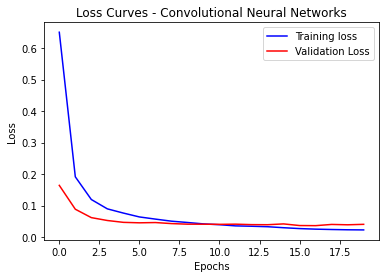

In [ ]:
plt.figure()
plt.plot(cnn_history.history['loss'], 'blue')
plt.plot(cnn_history.history['val_loss'], 'red')
plt.legend(['Training loss', 'Validation Loss'])
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Curves - Convolutional Neural Networks')

# Lesson #4: Introduction to Large Scale Image Recognition Architecture



Over time, numerous CNN architectures have been developed, most of which follow the fundamental method of applying convolution layers to the input and periodically downsampling. In this section, we will briefly discuss some of these architectures.&nbsp;

### **Image Net**

ImageNet is a large image dataset commonly used for research with the images labelled and organised by hierarchy. The dataset contains more than 14 million images labelled into over 20,000 categories. ImageNet Large Scale Visual Recognition Challenge (ILSVRC) is an annual competition (2010 - 2017) where computer vision algorithms, especially for image classification and object detection,&nbsp; are evaluated&nbsp; and compared using subsets of the ImageNet. The challenge aims to set state of the art results for various tasks and techniques. Some of the architectures we will discuss have proven to be successful in ILSVRC.

### **AlexNet, VGG, ResNet and DenseNet**

**AlexNet:** Introduced in 2012, this network consists of 8 layers - 5 convolutional layers, 2 fully-connected layers, and one fully-connected output layer won the ILSVRC challenge in 2012. Although it’s similar to the LeNet architecture previously developed, AlexNet uses relu as the activation function, as opposed to the tanh which caused the model to train about six times faster. Additionally, max pooling layers with a window size of 3x3 and a stride of 2 overlap in this architecture.

**VGG - Visual Geometry Group:** this was introduced by Simonyan and Zisserman in 2014. This architecture which was the second runner up for ILSVRC in 2014 is a network that is roughly twice as deep. AlexNet uses convolutions with 3x3 kernels with padding of 1; and a 2x2 max pooling matrix with a stride of 2.&nbsp; It has 13 convolutional layers and 3 fully-connected layers, alongside a relu activation function as in AlexNet.

**ResNet - Residual Neural Network:** Used in 2015 to win ILSVRC, identified that although deeper networks performed better, they became difficult to optimise and suffered from vanishing gradients. To address these problems, skip connections were introduced in ResNet by authors from Microsoft Research with a speculation that deeper learners should be able to learn equally as shallow layers. This is a very deep network with 152 layers trained using skip connections, such that the signal for a layer is included in the output of the layer located higher up.

### **Transfer Learning and Image Augmentation**

Transfer learning is a concept of exporting the knowledge obtained in a particular task to a new task. Using the features that an existing model learnt with a lot more data can improve generalization in a new task or setting. The motivation for transfer learning stemmed from the fact that although many supervised models require a large number of labeled data, many scenarios typically do not have this because it’s time consuming and difficult to label data points.&nbsp; When performing transfer learning, what, when, and how to transfer are important questions that must be answered. The portion of the knowledge learnt by the source model which would be beneficial to the new model to improve performance should be identified.&nbsp;

Also, while transfer learning is an option that can be used when training new models, it might not always improve performance in the new model, instead it might even contribute negatively.

Finally, it is helpful to identify how the knowledge will be transferred between models using different techniques and algorithms. For example, in computer vision, pre-trained models for challenging tasks using ImageNet are readily available to be used in transfer learning. Pre-trained models are models that have been trained on large datasets regularly reused in similar domains and tasks. Pre-trained models can serve as feature extractors or even used as they are. As explained earlier, the convolution layers that receive the inputs in CNNs learn a lot of low-level features in images, more complex features learnt in the middle layers, and the results of these computations are interpreted with the output layer. With a proper understanding of this, the relevant portions can be selected and integrated when creating new networks, either by freezing the existing weights to prevent updates; or update these weights when training the new model, hence, indirectly serving as a weight initialisation phase for the new model. Some of the models discussed above can be used for transfer learning in computer vision tasks.

Image augmentation in computer vision is not new, in fact, it is extremely important for sparse datasets. As mentioned earlier, augmentation helps to create a larger dataset by adding noise, rotating, flipping, cropping, rotating etc to the training dataset. This helps reduce overfitting and improve the model’s capacity to generalise even to unfamiliar scenarios in new unseen data.


In [ ]:
from tensorflow.keras.applications import ResNet50V2
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet_v2 import preprocess_input, decode_predictions
import urllib

In [ ]:
resNet50v2 = ResNet50V2(weights='imagenet')


In [ ]:
def imgRecognition(url, model):
    urllib.request.urlretrieve(url, "sample.png")
    img_path = "sample.png"

    display(Image(filename=img_path))

    img = image.load_img(img_path, target_size=(224,224))
    x = np.array(img)
    x = np.expand_dims(x, axis=0)
    x= preprocess_input(x)

    preds = model.predict(x)
    print('Predictd:', decode_predictions(preds, top=4)[0])

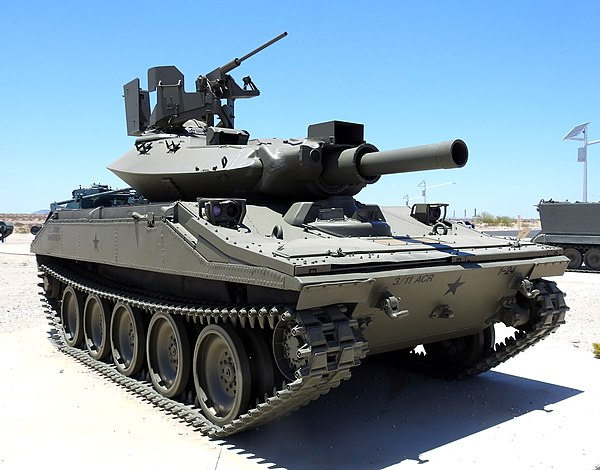

Predictd: [('n04389033', 'tank', 0.99926585), ('n02704792', 'amphibian', 0.00038970308), ('n02950826', 'cannon', 0.0001514314), ('n03478589', 'half_track', 0.00012068928)]


In [ ]:
imgRecognition('https://upload.wikimedia.org/wikipedia/commons/thumb/0/0a/Yuma_Proving_Ground%2C_Arizona_%2842188342504%29.jpg/600px-Yuma_Proving_Ground%2C_Arizona_%2842188342504%29.jpg',
              resNet50v2)

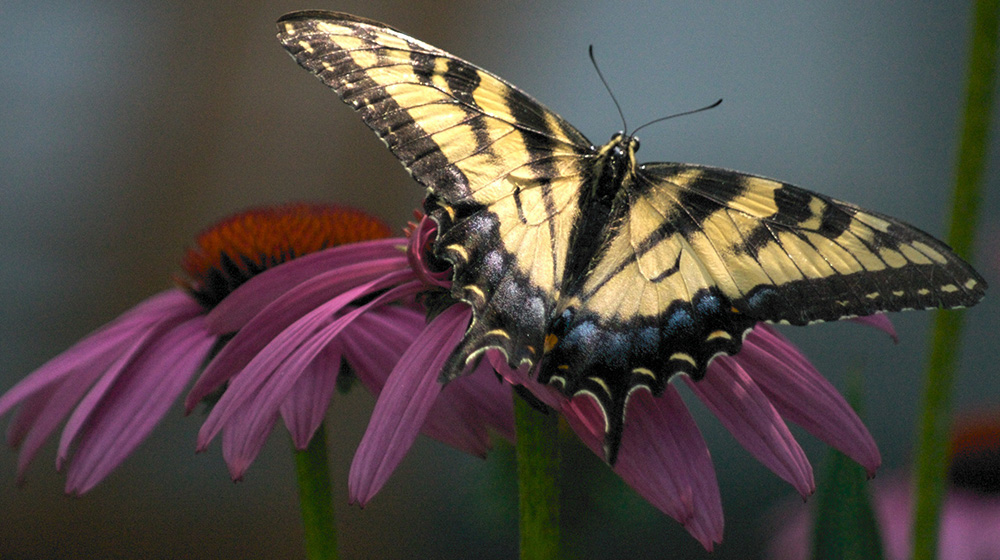

Predictd: [('n02279972', 'monarch', 0.9674714), ('n02277742', 'ringlet', 0.0134383), ('n02276258', 'admiral', 0.008971898), ('n02281787', 'lycaenid', 0.00490364)]


In [ ]:
imgRecognition('https://helpx.adobe.com/content/dam/help/en/stock/how-to/visual-reverse-image-search/jcr_content/main-pars/image/visual-reverse-image-search-v2_intro.jpg',
              resNet50v2)

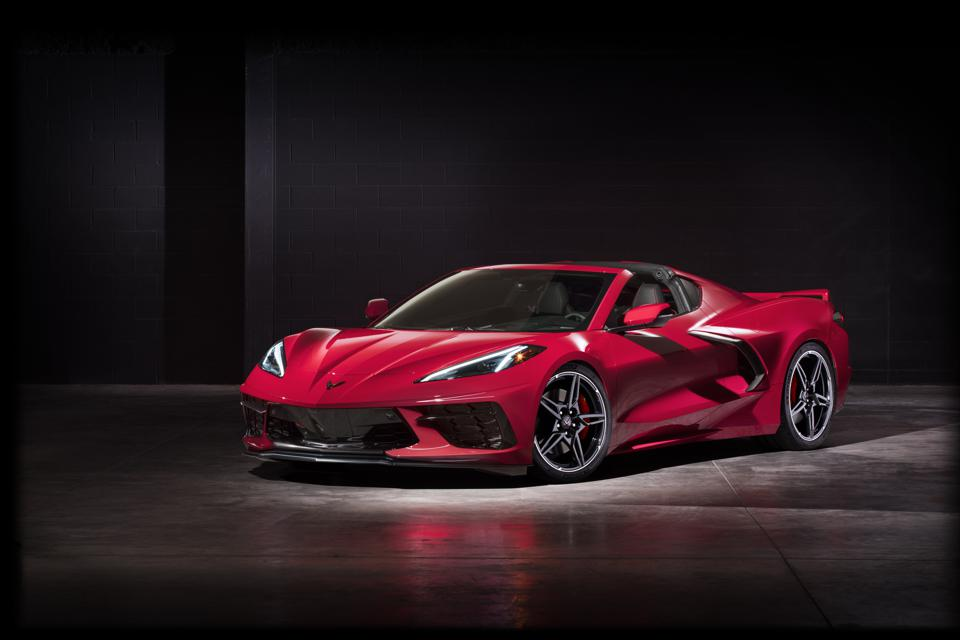

Predictd: [('n04285008', 'sports_car', 0.9003714), ('n04037443', 'racer', 0.086761326), ('n02974003', 'car_wheel', 0.011377245), ('n03100240', 'convertible', 0.0006371137)]


In [ ]:
imgRecognition('https://specials-images.forbesimg.com/imageserve/5d35eacaf1176b0008974b54/960x0.jpg',
              resNet50v2)

# Lesson #5: Object Detection - Multi-Object Classification plus Localization

### **Motivations and Terms**

In object localisation tasks, the location of objects in images are identified and put in boundary boxes, while classification assigns a label to each image. Object detection, often referred to as object recognition, involves a combination of object classification and object localisation such that different objects in an image are found and classified. In object detection, the output is variable in length because the number of objects detected in different images may change. Object detection can be used for face detection as seen in some cameras, counting,&nbsp; and visual search engines such as those of Pinterest, and aerial image analysis. The problem with obtaining a variable number of objects is that it becomes difficult to obtain fixed-sized vectors. However, sliding windows computed convolutionally&nbsp; are commonly used to resolve this.&nbsp;

Region-based Convolutional Neural Network (R-CNN) is a well-known architecture used for object detection, such that a selective search algorithm generates about 2000 region proposals, which are later passed to a CNN for feature extraction. An SVM (Support Vector Machine) is used to classify objects in the region proposal, then a boundary box regression is used to localise objects present. Region proposals are smaller parts of the original image identified to possibly contain the objects being searched for.&nbsp; Bounding box regressor uses a scale-invariant linear regression model to create bounding boxes for the objects. They learn a target transformation between the predicted proposal and the ground truth. When training the model, pairs of predicted and ground truth of four localisation dimensions are used such that the predicted bounding box $p = (p_x, p_y, p_w, p_h)$ with $p_x$ and $p_y$ as the center coordinates, $p_w$ the width and $p_h$ the height while the ground truth is $g= (g, g_y, g_w, g_h)$. The transformation between both boxes using the linear regressor can be represented as: $ĝ_x =p_wd_x(p) + p_x, ĝ_y =p_hd_y(p) + p_y, ĝ_w =p_wexp\left(d_w\left(p\right)\right), ĝ_h =p_hexp\left(d_h\left(p\right)\right)$

In [ ]:
Image(url= 'https://hamoyeusercontent-prod.s3.amazonaws.com/75a6120705dd7801f000')

A downside of R-CNN is that it is computationally expensive and slow due to the many forward computations performed by CNNs on the proposed regions for a single image.

Another object detection algorithm that is less computationally expensive is a type of single shot detection (SSD) algorithm called You Only Look Once “YOLO”. It is a cutting-edge detection algorithm that can identify distinct objects within the space of an image. It looks at the image once, divides it into grid cells which are responsible for predicting bounding boxes, and output a score known as the Intersection Over Union (IOU). For each bounding box, the grid cells also predict a class alongside the probability distribution over all possible classes. The class-specific confidence score is a multiplication of the individual box confidence predictions, and the conditional class probabilities.

In [ ]:
# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.3.0
The following GPU devices are available: 


In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

Image downloaded to /tmp/tmp4ca0des_.jpg.


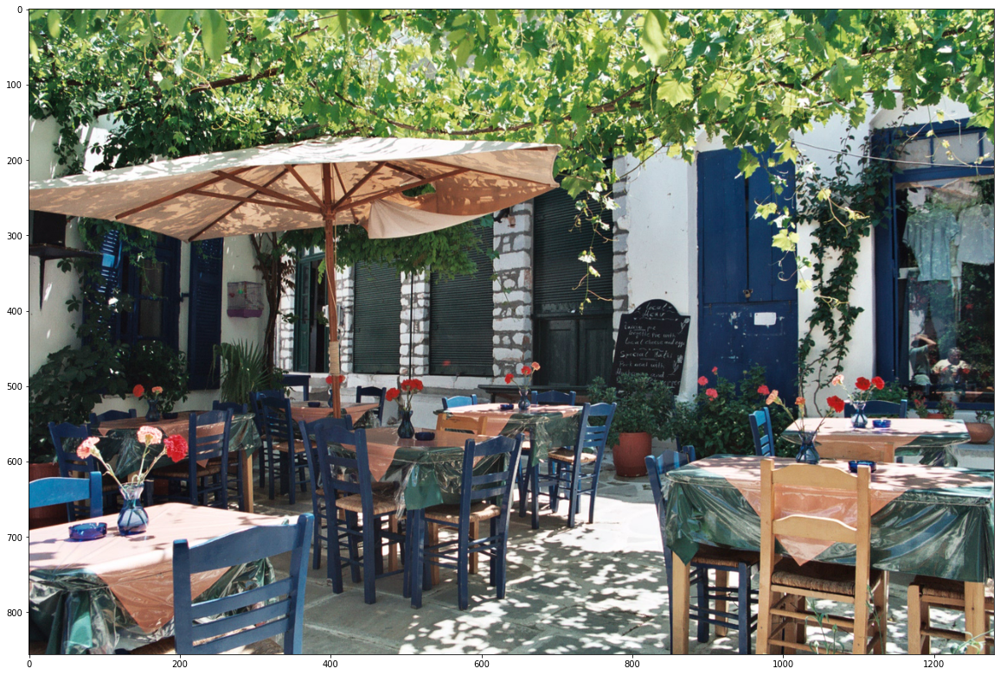

In [ ]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" 

detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  49.461901903152466


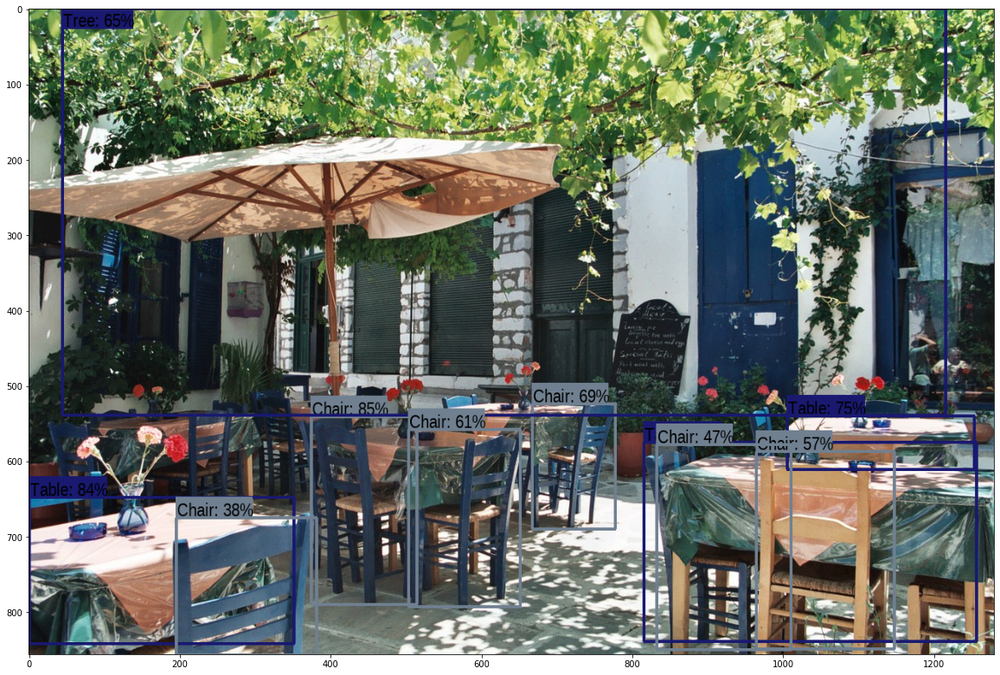

In [ ]:
run_detector(detector, downloaded_image_path)

In [ ]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:", end_time-start_time)

Image downloaded to /tmp/tmpfcuo8rwt.jpg.
Found 100 objects.
Inference time:  26.35045599937439
Inference time: 27.003920555114746


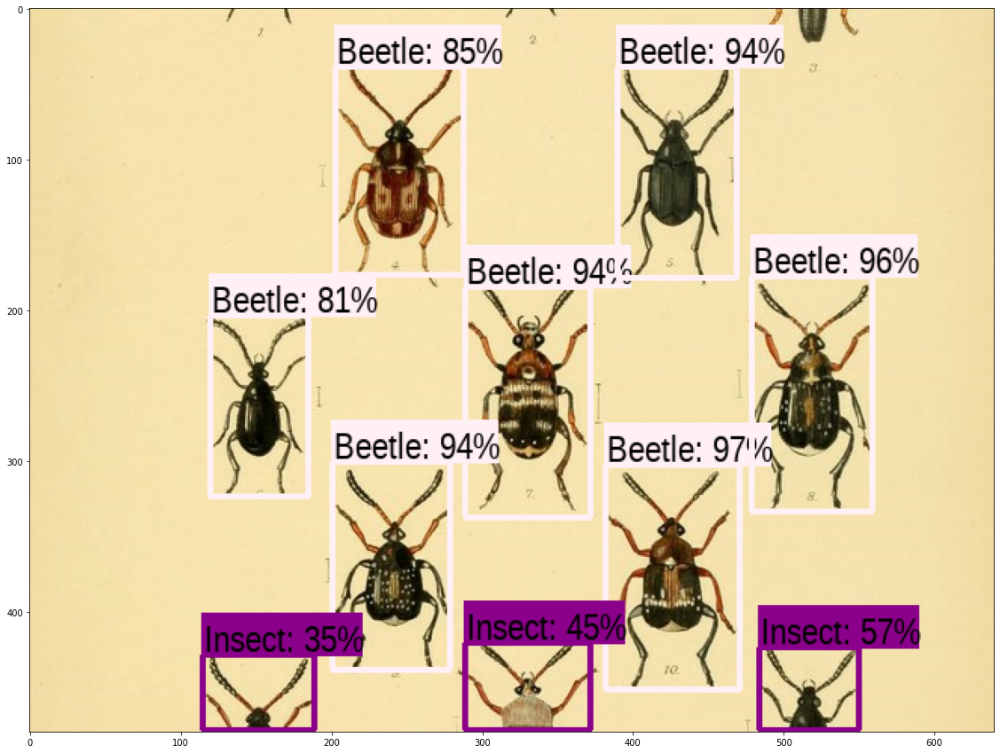

In [ ]:
detect_img(image_urls[0])

Image downloaded to /tmp/tmpqftvc1_f.jpg.
Found 100 objects.
Inference time:  26.429466724395752
Inference time: 27.01092767715454


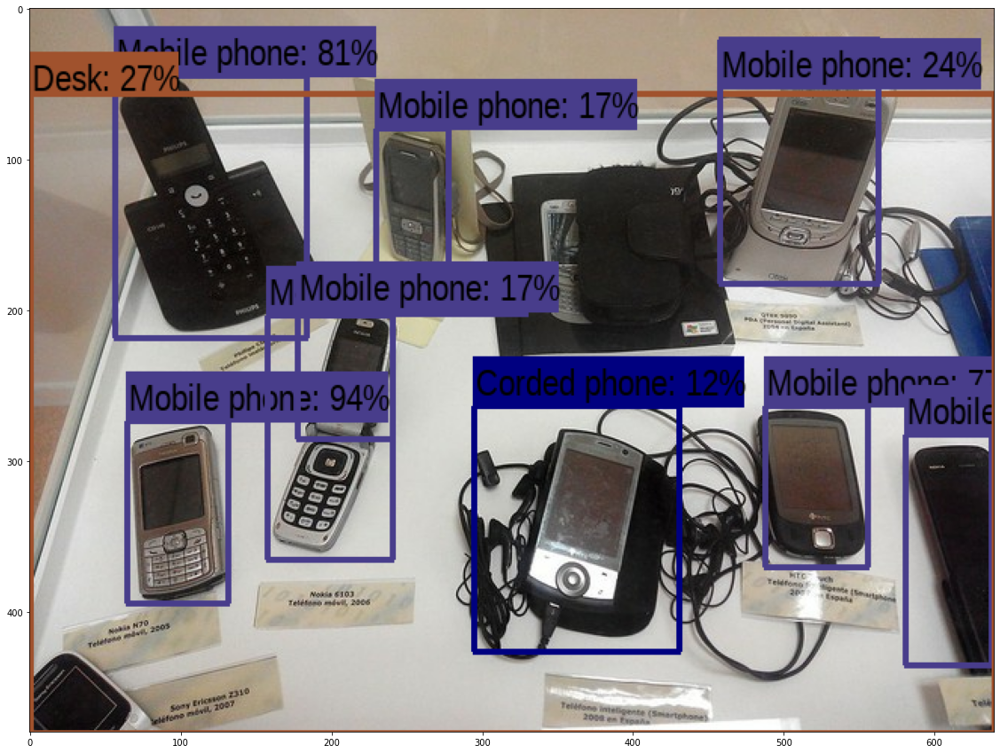

In [ ]:
detect_img(image_urls[1])

Image downloaded to /tmp/tmpiid4ma3x.jpg.
Found 100 objects.
Inference time:  26.354806423187256
Inference time: 26.95803213119507


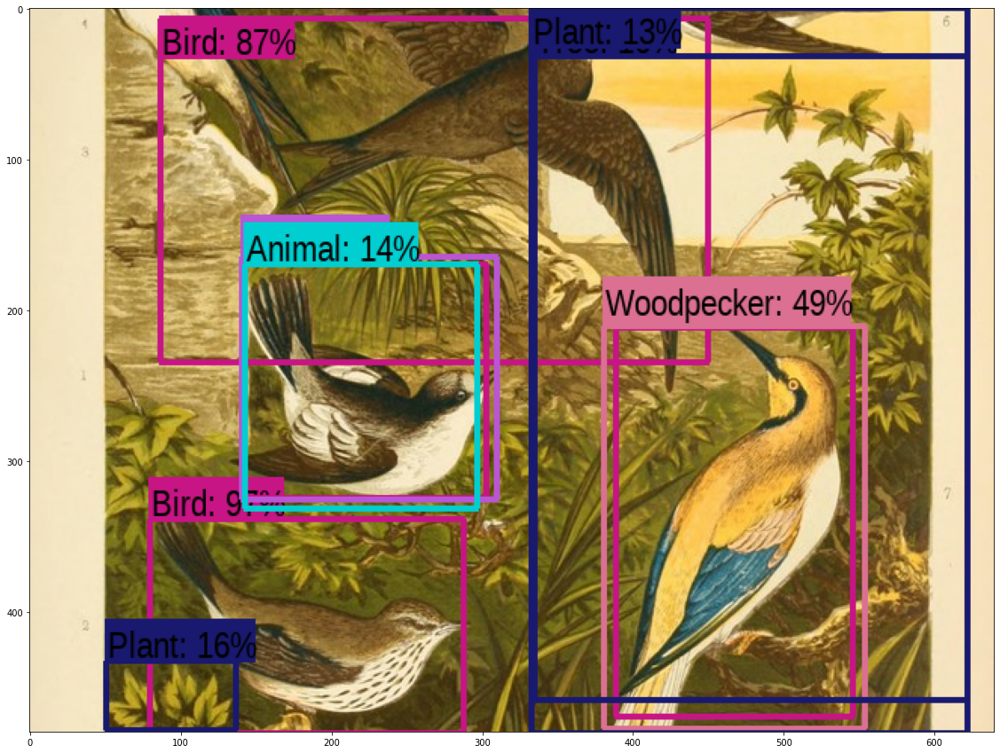

In [ ]:
detect_img(image_urls[2])

Image downloaded to /tmp/tmp98oe2p1l.jpg.
Found 100 objects.
Inference time:  28.422796726226807
Inference time: 28.890706062316895


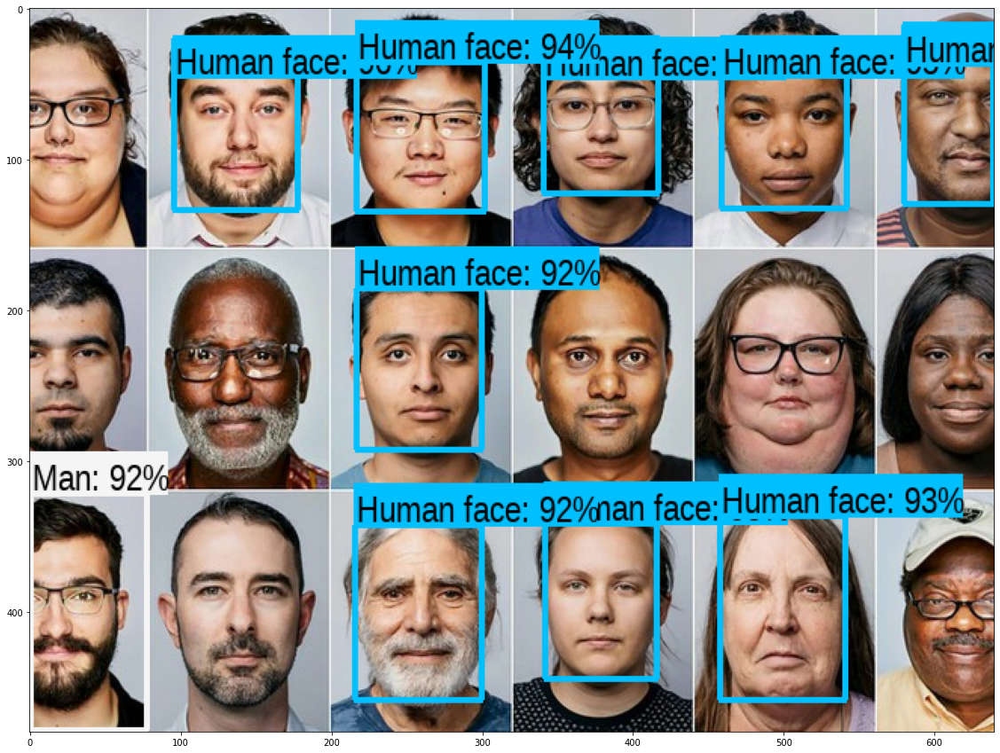

In [ ]:
detect_img("https://static01.nyt.com/images/2019/10/02/video/02-still-for-america-room-loop/02-still-for-america-room-loop-jumbo.jpg?quality=90&auto=webp")

Image downloaded to /tmp/tmpu93ynqr0.jpg.
Found 100 objects.
Inference time:  26.40584421157837
Inference time: 27.200398445129395


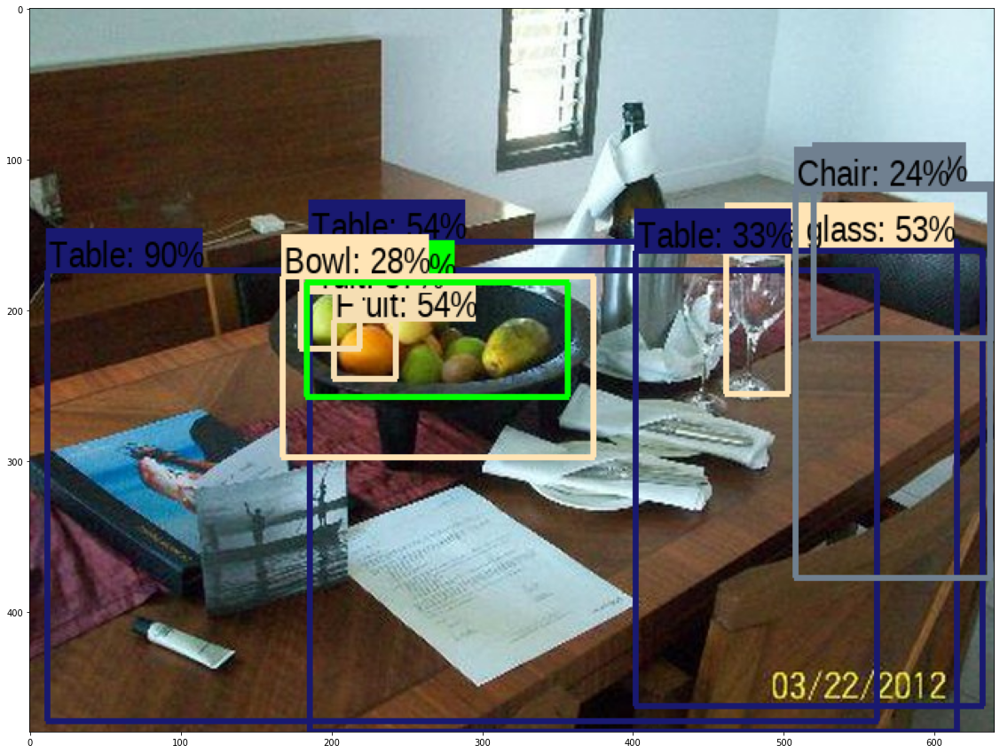

In [ ]:
detect_img("https://media-cdn.tripadvisor.com/media/photo-s/02/66/43/59/filename-100-2655-jpg.jpg")